In [325]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import sklearn
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import seaborn as sns
import re

data = pd.read_csv("/Users/alexpham/Downloads/kagglex-cohort4/train.csv")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

for column in data.columns:
    if data[column].dtype == object:
        data[column] = data[column].astype(pd.StringDtype())
        
# data.head(100)

data.replace('–', np.nan, inplace=True)
data.dropna(inplace=True)

data[data["id"]==3355]
print(len(data))

52893


In [326]:
example = data.groupby("brand")["price"].mean().astype("int64")
low_brand = []
med_brand = []
high_brand = []
df = example.to_frame()

# for index, row in data.iterrows():
#     engine = row["engine"]
#     row_id = row['id']
#     if "Turbo" in engine:
#         turbo.append(1)
#     elif "Turbo" not in engine:
#         turbo.append(0)

for index, row in df.iterrows():  
    brand = index
    price = row['price']
    if price <= 25000:
        low_brand.append(1)
        med_brand.append(0)
        high_brand.append(0)
    elif price >25000 and price <=50000:
        low_brand.append(0)
        med_brand.append(1)
        high_brand.append(0)
    else:
        low_brand.append(0)
        med_brand.append(0)
        high_brand.append(1)

df["low_brand"] = low_brand
df["med_brand"] = med_brand
df["high_brand"] = high_brand

brand_categorization = df.drop(columns=["price"])
brand_categorization

,low_brand,med_brand,high_brand
brand,,,
Acura,0,1,0
Alfa,0,1,0
Aston,0,0,1
Audi,0,1,0
BMW,0,1,0
Bentley,0,0,1
Bugatti,0,0,1
Buick,0,1,0
Cadillac,0,1,0


In [327]:
merged_brand_data = pd.merge(data, brand_categorization, on='brand', how='left')
merged_brand_data.head(50)

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,low_brand,med_brand,high_brand
0,0,Ford,F-150 Lariat,2018,74349,Gasoline,375.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,10-Speed A/T,Blue,Gray,None reported,Yes,11000,0,1,0
1,1,BMW,335 i,2007,80000,Gasoline,300.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,6-Speed M/T,Black,Black,None reported,Yes,8250,0,1,0
2,2,Jaguar,XF Luxury,2009,91491,Gasoline,300.0HP 4.2L 8 Cylinder Engine Gasoline Fuel,6-Speed A/T,Purple,Beige,None reported,Yes,15000,0,1,0
3,3,BMW,X7 xDrive40i,2022,2437,Hybrid,335.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,Transmission w/Dual Shift Mode,Gray,Brown,None reported,Yes,63500,0,1,0
4,4,Pontiac,Firebird Base,2001,111000,Gasoline,200.0HP 3.8L V6 Cylinder Engine Gasoline Fuel,A/T,White,Black,None reported,Yes,7850,1,0,0
5,5,Acura,Integra LS,2003,124756,Gasoline,140.0HP 1.8L 4 Cylinder Engine Gasoline Fuel,5-Speed M/T,Red,Beige,At least 1 accident or damage reported,Yes,4995,0,1,0
6,6,Audi,S5 3.0T Prestige,2014,107380,Gasoline,333.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,7-Speed A/T,Gray,Black,None reported,Yes,26500,0,1,0
7,7,GMC,Acadia SLT-1,2019,51300,Gasoline,193.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,6-Speed A/T,White,Black,At least 1 accident or damage reported,Yes,25500,0,1,0
8,8,Audi,A3 2.0T Tech Premium,2016,87842,Gasoline,200.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Silver,Black,None reported,Yes,13999,0,1,0
9,9,Acura,MDX Technology,2007,152270,Gasoline,300.0HP 3.7L V6 Cylinder Engine Gasoline Fuel,5-Speed A/T,Gray,Beige,At least 1 accident or damage reported,Yes,6700,0,1,0


In [328]:
#none of the data is null
data = merged_brand_data
data.isnull().sum()

id              0
brand           0
model           0
model_year      0
milage          0
fuel_type       0
engine          0
transmission    0
ext_col         0
int_col         0
accident        0
clean_title     0
price           0
low_brand       0
med_brand       0
high_brand      0
dtype: int64

In [329]:
#check duplicates
data.duplicated().sum()

0

In [330]:
#check data types
data.dtypes

id               int64
brand           string
model           string
model_year       int64
milage           int64
fuel_type       string
engine          string
transmission    string
ext_col         string
int_col         string
accident        string
clean_title     string
price            int64
low_brand        int64
med_brand        int64
high_brand       int64
dtype: object

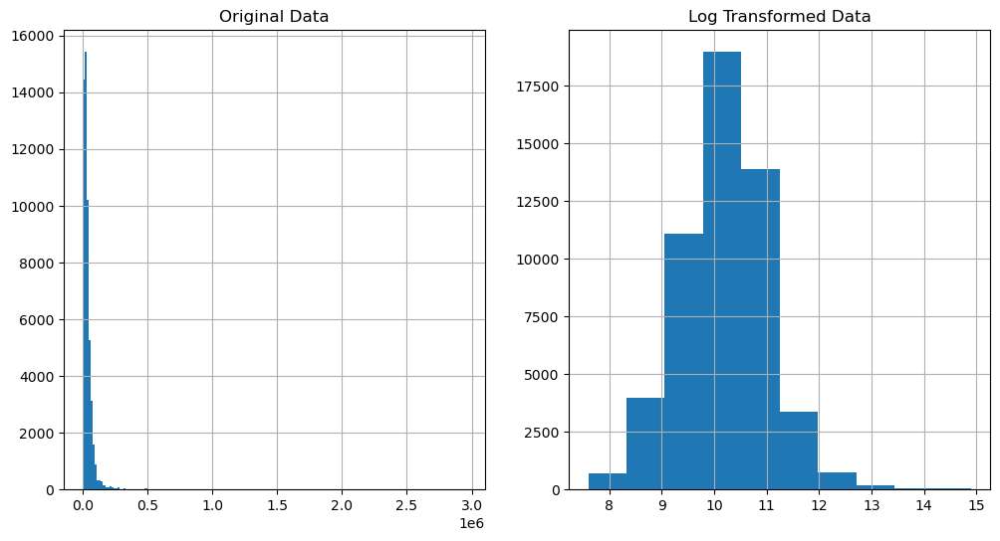

In [331]:
#Distribution of price

data['price_log_transformed'] = np.log(data['price'] + 1)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
data['price'].hist(bins=200, ax=axes[0])
axes[0].set_title('Original Data')
data['price_log_transformed'].hist(ax=axes[1])
axes[1].set_title('Log Transformed Data')
plt.show()

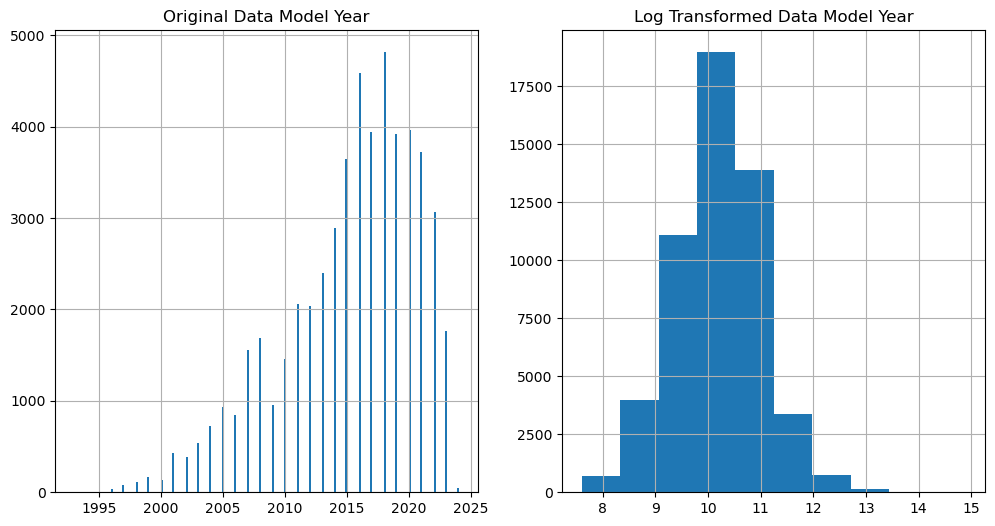

In [332]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

data['model_year_log_transformed'] = np.log(data['model_year'] + 1)

data['model_year'].hist(bins=200, ax=axes[0])
axes[0].set_title('Original Data Model Year')
data['price_log_transformed'].hist(ax=axes[1])
axes[1].set_title('Log Transformed Data Model Year')
plt.show()

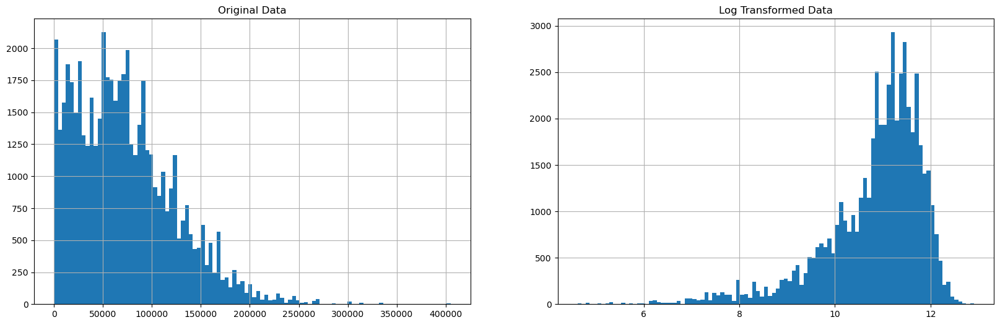

In [333]:
##NEED TO SHOW HISTOGRAM OF MILAGE, ALSO NEED TO PLOT PRICE VS. MILAGE

data['milage_log_transformed'] = np.log(data['milage'] + 1)

fig, axes = plt.subplots(1, 2, figsize=(20, 6))
data['milage'].hist(bins=100, ax=axes[0])
axes[0].set_title('Original Data')
data['milage_log_transformed'].hist(bins=100, ax=axes[1])
axes[1].set_title('Log Transformed Data')
plt.show()

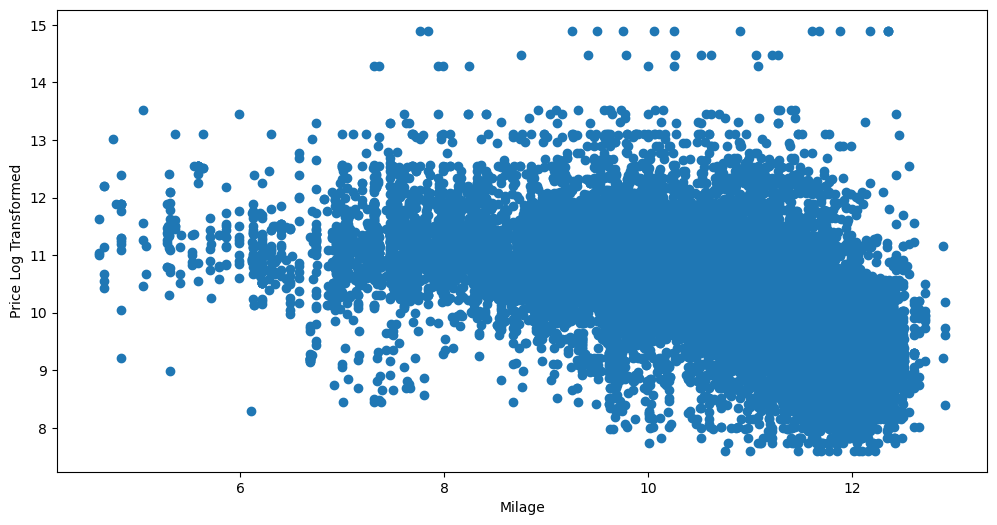

In [334]:


fig, axes = plt.subplots(1, figsize=(12, 6))
plt.scatter(data["milage_log_transformed"], data['price_log_transformed'])
plt.xlabel("Milage")
plt.ylabel("Price Log Transformed")
plt.show()

In [335]:
### SHOW HISTOGRAM PLOTS OF CAR COLOR AND PRICE TO SEE IF THERE'S ANY CORRELATION???



In [336]:
dropped_data = data.drop(columns=["transmission", "ext_col", "int_col", "clean_title"], axis=1)
dropped_data.head(10)

,id,brand,model,model_year,milage,fuel_type,engine,accident,price,low_brand,med_brand,high_brand,price_log_transformed,model_year_log_transformed,milage_log_transformed
0,0,Ford,F-150 Lariat,2018,74349,Gasoline,375.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,None reported,11000,0,1,0,9.305741,7.610358,11.216539
1,1,BMW,335 i,2007,80000,Gasoline,300.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,None reported,8250,0,1,0,9.018090,7.604894,11.289794
2,2,Jaguar,XF Luxury,2009,91491,Gasoline,300.0HP 4.2L 8 Cylinder Engine Gasoline Fuel,None reported,15000,0,1,0,9.615872,7.605890,11.424007
3,3,BMW,X7 xDrive40i,2022,2437,Hybrid,335.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,None reported,63500,0,1,0,11.058811,7.612337,7.798933
4,4,Pontiac,Firebird Base,2001,111000,Gasoline,200.0HP 3.8L V6 Cylinder Engine Gasoline Fuel,None reported,7850,1,0,0,8.968396,7.601902,11.617294
5,5,Acura,Integra LS,2003,124756,Gasoline,140.0HP 1.8L 4 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,4995,0,1,0,8.516393,7.602900,11.734123
6,6,Audi,S5 3.0T Prestige,2014,107380,Gasoline,333.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,None reported,26500,0,1,0,10.184938,7.608374,11.584139
7,7,GMC,Acadia SLT-1,2019,51300,Gasoline,193.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,25500,0,1,0,10.146473,7.610853,10.845466
8,8,Audi,A3 2.0T Tech Premium,2016,87842,Gasoline,200.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,None reported,13999,0,1,0,9.546813,7.609367,11.383306
9,9,Acura,MDX Technology,2007,152270,Gasoline,300.0HP 3.7L V6 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,6700,0,1,0,8.810012,7.604894,11.933417


In [337]:
###COME BACK TO HOW YOU THINK ABOUT ENGINE!!!


average_horsepower = 0
length = 0
horsepower = []

for engine in data["engine"]:
    #Displacement
    if "HP" in engine:
        average_horsepower += int(engine.split()[0][0:-4])
        length +=1

average_horsepower/=length
print(average_horsepower)

for engine in data["engine"]:
    if "HP" in engine:
        horsepower.append(int(engine.split()[0][0:-4]))
    else:
        horsepower.append(average_horsepower)

        
#3.0L OR 3.0 LITERS NEED TO ACCOUNT FOR BOTH
#LOOK INTO THE HP STRUCTURE -> THERE'S A VERY SPECIFIC STRUCTURE TO THE ENGINE WHEN IT HAS HP
#LOOK INTO THE NO HP STRUCTURE -> IT'S ALMOST ALWAYS V- OR I- OR H- or W
      #IF IT DOESN'T HAVE THIS STRUCTURE YOU CAN JUST PUT IT AS THE MOST COMMON CYLINDER
#Can look into if having a turbo will increase price
#DON'T THIS FUEL_TYPE IS GONNA HAVE A POSITIVE EFFECT ON ACCURACY
#CHANGE HORSEPOWER AVERAGE (DON'T INCLUDE THE ENGINES THAT DON'T HAVE HORSEPOWER)

turbo = []
Cylinder = []


#SET TURBO COLUMN
for index, row in data.iterrows():
    engine = row["engine"]
    row_id = row['id']
    if "Turbo" in engine:
        turbo.append(1)
    elif "Turbo" not in engine:
        turbo.append(0)

#SET CYLINDER COLUMN
for index, row in data.iterrows():
    engine = row["engine"]
    row_id = row['id']      
    if "HP" in engine and "Cylinder" in engine and ("Electric" not in engine or 'Rotary' not in engine):
        line = engine.split()
        cylinder_index = line.index("Cylinder") - 1
        Cylinder.append(line[cylinder_index].lstrip("VHIW"))
    elif ("Rotary" in engine or "Electric" in engine) and 'Cylinder' not in engine and "HP" in engine:
        Cylinder.append(0)
    elif "HP" not in engine and ("Electric" not in engine or 'Rotary' not in engine):
        cylinder = re.search("V[0-9]+.*|I[0-9]+.*|H[0-9]+.*|W[0-9]+.*|[0-9]\sCylinder+", engine)
        if cylinder:
            Cylinder.append(cylinder.group().split()[0].lstrip("VHIW"))
        else:
            Cylinder.append("AVERAGE")
            
#GET AVERAGE CYLINDER AND REPLACE
temp_average_cylinder = 0
length = 0

for cylinder in Cylinder:
    if cylinder != "AVERAGE":
        temp_average_cylinder += int(cylinder)
        length += 1

average_cylinder = int(temp_average_cylinder/length)

#NEED TO ADD THE NEW CYLINDER COLUMN TO DF AND REPLACE INPLACE WITH AVERAGE

print(len(Cylinder))
print(len(turbo))
print(f"average cylinders: {average_cylinder}")
        
dropped_data["turbo"] = turbo
dropped_data["cylinders"] = Cylinder
dropped_data["cylinders"].replace("AVERAGE", average_cylinder, inplace=True)
dropped_data["cylinders"] = dropped_data["cylinders"].astype("int64")
dropped_data["horsepower"] = horsepower
dropped_data["horsepower"] = dropped_data["horsepower"].astype("int64")

332.56632176912154
52893
52893
average cylinders: 6


In [338]:
dropped_data.head(10)


,id,brand,model,model_year,milage,fuel_type,engine,accident,price,low_brand,med_brand,high_brand,price_log_transformed,model_year_log_transformed,milage_log_transformed,turbo,cylinders,horsepower
0,0,Ford,F-150 Lariat,2018,74349,Gasoline,375.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,None reported,11000,0,1,0,9.305741,7.610358,11.216539,0,6,375
1,1,BMW,335 i,2007,80000,Gasoline,300.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,None reported,8250,0,1,0,9.018090,7.604894,11.289794,0,6,300
2,2,Jaguar,XF Luxury,2009,91491,Gasoline,300.0HP 4.2L 8 Cylinder Engine Gasoline Fuel,None reported,15000,0,1,0,9.615872,7.605890,11.424007,0,8,300
3,3,BMW,X7 xDrive40i,2022,2437,Hybrid,335.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,None reported,63500,0,1,0,11.058811,7.612337,7.798933,0,6,335
4,4,Pontiac,Firebird Base,2001,111000,Gasoline,200.0HP 3.8L V6 Cylinder Engine Gasoline Fuel,None reported,7850,1,0,0,8.968396,7.601902,11.617294,0,6,200
5,5,Acura,Integra LS,2003,124756,Gasoline,140.0HP 1.8L 4 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,4995,0,1,0,8.516393,7.602900,11.734123,0,4,140
6,6,Audi,S5 3.0T Prestige,2014,107380,Gasoline,333.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,None reported,26500,0,1,0,10.184938,7.608374,11.584139,0,6,333
7,7,GMC,Acadia SLT-1,2019,51300,Gasoline,193.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,25500,0,1,0,10.146473,7.610853,10.845466,0,4,193
8,8,Audi,A3 2.0T Tech Premium,2016,87842,Gasoline,200.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,None reported,13999,0,1,0,9.546813,7.609367,11.383306,0,4,200
9,9,Acura,MDX Technology,2007,152270,Gasoline,300.0HP 3.7L V6 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,6700,0,1,0,8.810012,7.604894,11.933417,0,6,300


In [339]:
dropped_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52893 entries, 0 to 52892
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          52893 non-null  int64  
 1   brand                       52893 non-null  string 
 2   model                       52893 non-null  string 
 3   model_year                  52893 non-null  int64  
 4   milage                      52893 non-null  int64  
 5   fuel_type                   52893 non-null  string 
 6   engine                      52893 non-null  string 
 7   accident                    52893 non-null  string 
 8   price                       52893 non-null  int64  
 9   low_brand                   52893 non-null  int64  
 10  med_brand                   52893 non-null  int64  
 11  high_brand                  52893 non-null  int64  
 12  price_log_transformed       52893 non-null  float64
 13  model_year_log_transformed  528

In [342]:
new_data = dropped_data
new_data.head(100)

,id,brand,model,model_year,milage,fuel_type,engine,accident,price,low_brand,med_brand,high_brand,price_log_transformed,model_year_log_transformed,milage_log_transformed,turbo,cylinders,horsepower,age,miles_per_year
0,0,Ford,F-150 Lariat,2018,74349,Gasoline,375.0HP 3.5L V6 Cylinder Engine Gasoline Fuel,None reported,11000,0,1,0,9.305741,7.610358,11.216539,0,6,375,6,12391
1,1,BMW,335 i,2007,80000,Gasoline,300.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,None reported,8250,0,1,0,9.018090,7.604894,11.289794,0,6,300,17,4705
2,2,Jaguar,XF Luxury,2009,91491,Gasoline,300.0HP 4.2L 8 Cylinder Engine Gasoline Fuel,None reported,15000,0,1,0,9.615872,7.605890,11.424007,0,8,300,15,6099
3,3,BMW,X7 xDrive40i,2022,2437,Hybrid,335.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,None reported,63500,0,1,0,11.058811,7.612337,7.798933,0,6,335,2,1218
4,4,Pontiac,Firebird Base,2001,111000,Gasoline,200.0HP 3.8L V6 Cylinder Engine Gasoline Fuel,None reported,7850,1,0,0,8.968396,7.601902,11.617294,0,6,200,23,4826
5,5,Acura,Integra LS,2003,124756,Gasoline,140.0HP 1.8L 4 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,4995,0,1,0,8.516393,7.602900,11.734123,0,4,140,21,5940
6,6,Audi,S5 3.0T Prestige,2014,107380,Gasoline,333.0HP 3.0L V6 Cylinder Engine Gasoline Fuel,None reported,26500,0,1,0,10.184938,7.608374,11.584139,0,6,333,10,10738
7,7,GMC,Acadia SLT-1,2019,51300,Gasoline,193.0HP 2.5L 4 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,25500,0,1,0,10.146473,7.610853,10.845466,0,4,193,5,10260
8,8,Audi,A3 2.0T Tech Premium,2016,87842,Gasoline,200.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,None reported,13999,0,1,0,9.546813,7.609367,11.383306,0,4,200,8,10980
9,9,Acura,MDX Technology,2007,152270,Gasoline,300.0HP 3.7L V6 Cylinder Engine Gasoline Fuel,At least 1 accident or damage reported,6700,0,1,0,8.810012,7.604894,11.933417,0,6,300,17,8957


In [343]:
#feature engineering
new_data["age"] = 2024-new_data['model_year']
col=np.array(new_data['milage'] // new_data['age'] , np.int64)
new_data['miles_per_year']=col


final_data = new_data.drop(columns=["engine", 'fuel_type'],axis=1)
final_data.head(100)

# final_data.info()

,id,brand,model,model_year,milage,accident,price,low_brand,med_brand,high_brand,price_log_transformed,model_year_log_transformed,milage_log_transformed,turbo,cylinders,horsepower,age,miles_per_year
0,0,Ford,F-150 Lariat,2018,74349,None reported,11000,0,1,0,9.305741,7.610358,11.216539,0,6,375,6,12391
1,1,BMW,335 i,2007,80000,None reported,8250,0,1,0,9.018090,7.604894,11.289794,0,6,300,17,4705
2,2,Jaguar,XF Luxury,2009,91491,None reported,15000,0,1,0,9.615872,7.605890,11.424007,0,8,300,15,6099
3,3,BMW,X7 xDrive40i,2022,2437,None reported,63500,0,1,0,11.058811,7.612337,7.798933,0,6,335,2,1218
4,4,Pontiac,Firebird Base,2001,111000,None reported,7850,1,0,0,8.968396,7.601902,11.617294,0,6,200,23,4826
5,5,Acura,Integra LS,2003,124756,At least 1 accident or damage reported,4995,0,1,0,8.516393,7.602900,11.734123,0,4,140,21,5940
6,6,Audi,S5 3.0T Prestige,2014,107380,None reported,26500,0,1,0,10.184938,7.608374,11.584139,0,6,333,10,10738
7,7,GMC,Acadia SLT-1,2019,51300,At least 1 accident or damage reported,25500,0,1,0,10.146473,7.610853,10.845466,0,4,193,5,10260
8,8,Audi,A3 2.0T Tech Premium,2016,87842,None reported,13999,0,1,0,9.546813,7.609367,11.383306,0,4,200,8,10980
9,9,Acura,MDX Technology,2007,152270,At least 1 accident or damage reported,6700,0,1,0,8.810012,7.604894,11.933417,0,6,300,17,8957


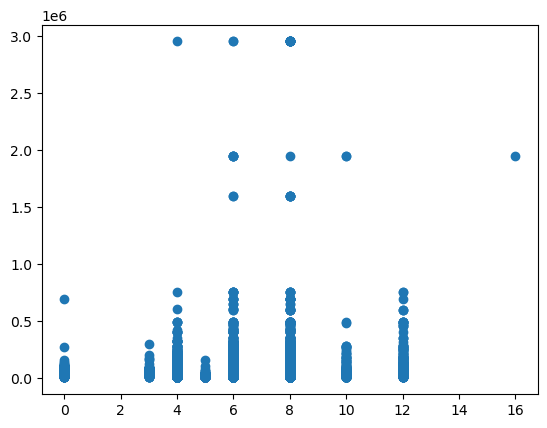

,id,brand,model,model_year,milage,accident,price,low_brand,med_brand,high_brand,price_log_transformed,model_year_log_transformed,milage_log_transformed,turbo,cylinders,horsepower,age,miles_per_year
2907,2983,Rolls-Royce,Ghost Base,2017,3500,None reported,259000,0,0,1,12.464587,7.609862,8.160804,0,12,563,7,500


In [344]:
plt.scatter(final_data["cylinders"], final_data["price"])
plt.show()

mask = final_data["id"] == 2983
final_data[mask]

In [345]:
categorical_columns = ["accident", "brand", 'model']
# numerical_columns = ["milage"]

new_encoded_data = final_data

label_encoder = LabelEncoder()

for column in categorical_columns:
    new_encoded_data[column] = label_encoder.fit_transform(new_encoded_data[column])
    
# scaler = StandardScaler()
# new_encoded_data[numerical_columns] = scaler.fit_transform(new_encoded_data[numerical_columns])

In [374]:
new_encoded_data.head()

,id,brand,model,model_year,milage,accident,price,low_brand,med_brand,high_brand,price_log_transformed,model_year_log_transformed,milage_log_transformed,turbo,cylinders,horsepower,age,miles_per_year
0,0,14,633,2018,74349,1,11000,0,1,0,9.305741,7.610358,11.216539,0,6,375,6,12391
1,1,4,45,2007,80000,1,8250,0,1,0,9.018090,7.604894,11.289794,0,6,300,17,4705
2,2,21,1756,2009,91491,1,15000,0,1,0,9.615872,7.605890,11.424007,0,8,300,15,6099
3,3,4,1733,2022,2437,1,63500,0,1,0,11.058811,7.612337,7.798933,0,6,335,2,1218
4,4,40,682,2001,111000,1,7850,1,0,0,8.968396,7.601902,11.617294,0,6,200,23,4826


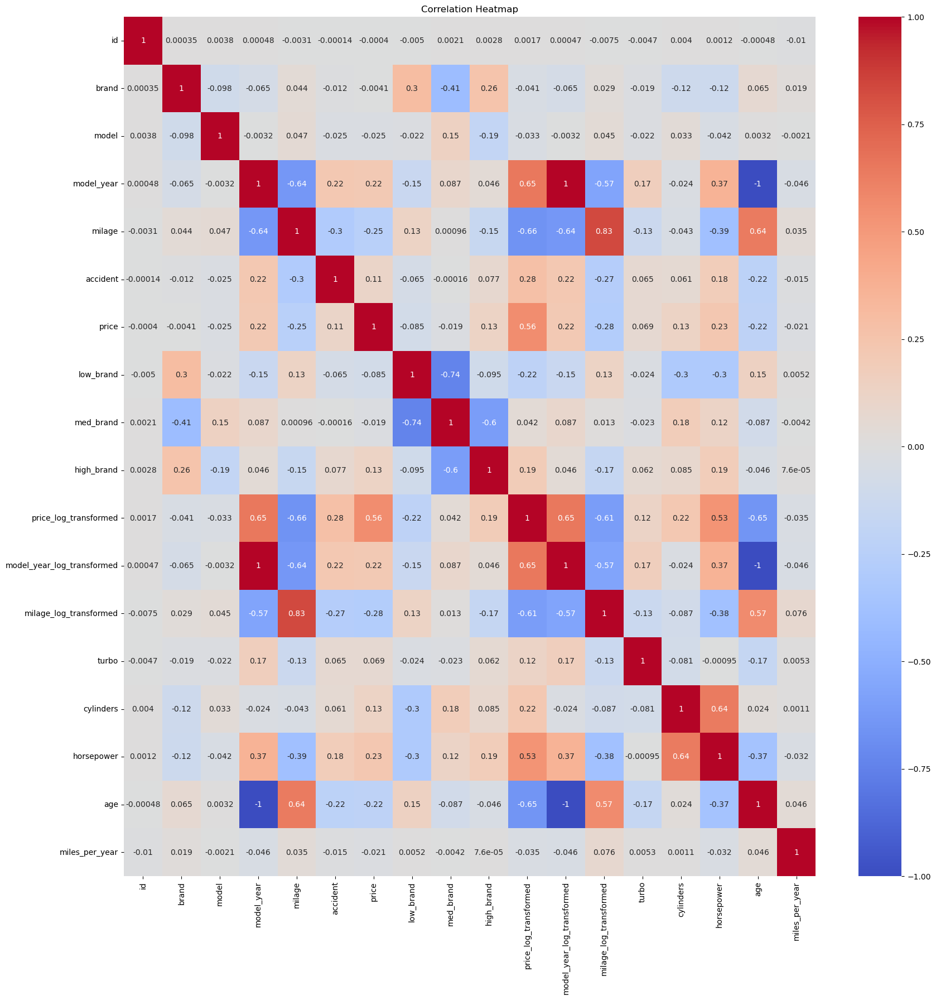

In [353]:
features= [columns for columns in new_encoded_data.columns]

correlation_matrix = final_data[features].corr()
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [354]:
# new_encoded_data['wear'] = new_encoded_data["wear"].astype("float32")

In [384]:
new_encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52893 entries, 0 to 52892
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          52893 non-null  int64  
 1   brand                       52893 non-null  int64  
 2   model                       52893 non-null  int64  
 3   model_year                  52893 non-null  int64  
 4   milage                      52893 non-null  int64  
 5   accident                    52893 non-null  int64  
 6   price                       52893 non-null  int64  
 7   low_brand                   52893 non-null  int64  
 8   med_brand                   52893 non-null  int64  
 9   high_brand                  52893 non-null  int64  
 10  price_log_transformed       52893 non-null  float64
 11  model_year_log_transformed  52893 non-null  float64
 12  milage_log_transformed      52893 non-null  float64
 13  turbo                       528

In [385]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Lasso

X = new_encoded_data.drop(['price', 'price_log_transformed'], axis=1)
X.info()
# y = new_encoded_data['price_log_transformed']

# X_train, X_test, y_train, y_test = train_test_split(X,y, test_size =0.2, random_state=42)

# # model = RandomForestRegressor(n_estimators=100, random_state=42)
# model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=3, random_state=42)
# # model = Lasso(alpha=1.0, random_state=42)
# model.fit(X_train,y_train)

# y_pred= model.predict(X_test)
# print("Accuracy on Traing set: ",model.score(X_train,y_train))
# print("Accuracy on Testing set: ",model.score(X_test,y_test))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52893 entries, 0 to 52892
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          52893 non-null  int64  
 1   brand                       52893 non-null  int64  
 2   model                       52893 non-null  int64  
 3   model_year                  52893 non-null  int64  
 4   milage                      52893 non-null  int64  
 5   accident                    52893 non-null  int64  
 6   low_brand                   52893 non-null  int64  
 7   med_brand                   52893 non-null  int64  
 8   high_brand                  52893 non-null  int64  
 9   model_year_log_transformed  52893 non-null  float64
 10  milage_log_transformed      52893 non-null  float64
 11  turbo                       52893 non-null  int64  
 12  cylinders                   52893 non-null  int64  
 13  horsepower                  528

In [274]:
mse = mean_squared_error(y_test, y_pred)
r2_square = r2_score(y_test,y_pred)
print(f" R-squared: {r2_square}")
print(f'Mean Squared Error: {mse}')

 R-squared: 0.06593260725277184
Mean Squared Error: 6044660889.901009


In [153]:
cv = ShuffleSplit(n_splits=10, test_size=.20, random_state=0)
print(cross_val_score(model, X, y, cv=cv))

KeyboardInterrupt: 

In [357]:
pred_df=pd.DataFrame({'Actual Value':np.exp(y_test),'Predicted Value':np.exp(y_pred),'Difference':np.exp(y_test)-np.exp(y_pred)})
pred_df

,Actual Value,Predicted Value,Difference
38447,10001.0,14881.466436,-4.880466e+03
9084,27501.0,33669.038710,-6.168039e+03
16954,51901.0,68895.789520,-1.699479e+04
18110,52001.0,72058.173041,-2.005717e+04
48792,27501.0,31508.679632,-4.007680e+03
7949,40501.0,60373.187347,-1.987219e+04
39859,139000.0,71574.856117,6.742514e+04
23637,62480.0,65742.179538,-3.262180e+03
462,12501.0,12556.872876,-5.587288e+01
42683,32001.0,44231.569603,-1.223057e+04


In [358]:
###Actual dataframe to submit (theoretical)

y_predict_train = model.predict(X)

print("Accuracy on Full set: ",model.score(X,y))

result_df = pd.DataFrame({'id':X['id'], 'price': np.exp(y_predict_train)})
result_df

Accuracy on Full set:  0.657196736326556


,id,price
0,0,18360.209021
1,1,11313.682931
2,2,15225.527757
3,3,68711.374185
4,4,10357.892350
5,5,7051.934400
6,6,19857.446599
7,7,25568.104059
8,8,16639.800853
9,9,8524.899440


In [368]:
### NEED TO PREP TEST DATASET AND SUBMIT TO KAGGLE!

# isnull
# duplicated
# dtypes
# log transform price
# log transform milage
# dropped_data = data.drop(columns=[ "fuel_type", "transmission", "ext_col", "int_col", "clean_title"], axis=1)
# horsepower feature engineering
# age and miles per year feature engineering
# encode categorical data
# run it through model





submission_data = pd.read_csv("/Users/alexpham/Downloads/kagglex-cohort4/test.csv")

for column in submission_data.columns:
    if submission_data[column].dtype == object:
        submission_data[column] = submission_data[column].astype(pd.StringDtype())

submission_data.replace('–', np.nan, inplace=True)
submission_data.dropna(inplace=True)

merged_brand_data = pd.merge(submission_data, brand_categorization, on='brand', how='left')

new_merged_data = merged_brand_data

new_merged_data['milage_log_transformed'] = np.log(new_merged_data['milage'] + 1)
new_merged_data['model_year_log_transformed'] = np.log(new_merged_data['model_year'] + 1)


submission_data_dropped = new_merged_data.drop(columns=["transmission", "ext_col", "int_col", "clean_title"], axis=1)


submission_average_horsepower = 0
submission_horsepower_length = 0
submission_horsepower = []

for engine in submission_data["engine"]:
    #Displacement
    if "HP" in engine:
        submission_average_horsepower += int(engine.split()[0][0:-4])
        submission_horsepower_length +=1

submission_average_horsepower/=submission_horsepower_length

for engine in submission_data["engine"]:
    if "HP" in engine:
        submission_horsepower.append(int(engine.split()[0][0:-4]))
    else:
        submission_horsepower.append(submission_average_horsepower)

        
#3.0L OR 3.0 LITERS NEED TO ACCOUNT FOR BOTH
#LOOK INTO THE HP STRUCTURE -> THERE'S A VERY SPECIFIC STRUCTURE TO THE ENGINE WHEN IT HAS HP
#LOOK INTO THE NO HP STRUCTURE -> IT'S ALMOST ALWAYS V- OR I- OR H- or W
      #IF IT DOESN'T HAVE THIS STRUCTURE YOU CAN JUST PUT IT AS THE MOST COMMON CYLINDER
#Can look into if having a turbo will increase price
#DON'T THIS FUEL_TYPE IS GONNA HAVE A POSITIVE EFFECT ON ACCURACY
#CHANGE HORSEPOWER AVERAGE (DON'T INCLUDE THE ENGINES THAT DON'T HAVE HORSEPOWER)

submission_turbo = []
submission_Cylinder = []


#SET TURBO COLUMN
for index, row in submission_data.iterrows():
    engine = row["engine"]
    row_id = row['id']
    if "Turbo" in engine:
        submission_turbo.append(1)
    elif "Turbo" not in engine:
        submission_turbo.append(0)

#SET CYLINDER COLUMN
for index, row in submission_data.iterrows():
    engine = row["engine"]
    row_id = row['id']      
    if "HP" in engine and "Cylinder" in engine and ("Electric" not in engine or 'Rotary' not in engine):
        line = engine.split()
        cylinder_index = line.index("Cylinder") - 1
        submission_Cylinder.append(line[cylinder_index].lstrip("VHIW"))
    elif ("Rotary" in engine or "Electric" in engine) and 'Cylinder' not in engine and "HP" in engine:
        submission_Cylinder.append(0)
    elif "HP" not in engine and ("Electric" not in engine or 'Rotary' not in engine):
        cylinder = re.search("V[0-9]+.*|I[0-9]+.*|H[0-9]+.*|W[0-9]+.*|[0-9]\sCylinder+", engine)
        if cylinder:
            submission_Cylinder.append(cylinder.group().split()[0].lstrip("VHIW"))
        else:
            submission_Cylinder.append("AVERAGE")
            
#GET AVERAGE CYLINDER AND REPLACE
submission_temp_average_cylinder = 0
submission_cylinder_length = 0

for cylinder in submission_Cylinder:
    if cylinder != "AVERAGE":
        submission_temp_average_cylinder += int(cylinder)
        submission_cylinder_length += 1

submission_average_cylinder = int(submission_temp_average_cylinder/submission_cylinder_length)
        
submission_data_dropped["turbo"] = submission_turbo
submission_data_dropped["cylinders"] = submission_Cylinder
submission_data_dropped["cylinders"].replace("AVERAGE", submission_average_cylinder, inplace=True)
submission_data_dropped["cylinders"] = submission_data_dropped["cylinders"].astype("int64")
submission_data_dropped["horsepower"] = submission_horsepower
submission_data_dropped["horsepower"] = submission_data_dropped["horsepower"].astype("int64")


submission_data_dropped["age"] = 2024 - submission_data_dropped['model_year']
submission_col=np.array(submission_data_dropped['milage'] // submission_data_dropped['age'] , np.int64)
submission_data_dropped['miles_per_year']=submission_col



final_data = submission_data_dropped.drop(columns=["engine", 'fuel_type'],axis=1)
final_data.head(10)

# # final_data.info()

categorical_columns = ["accident", "brand", 'model']

label_encoder = LabelEncoder()

for column in categorical_columns:
    final_data[column] = label_encoder.fit_transform(final_data[column])
    
final_data.head(10)


# y_predict_train = model.predict(final_data)

# result_df = pd.DataFrame({'id':final_data['id'], 'price': np.exp(y_predict_train)})
# result_df

# file_path = '/Users/alexpham/Downloads/kagglex-cohort4/car_prices.csv'
# result_df.to_csv(file_path, index=False)

# print(f'DataFrame exported to {file_path}')

,id,brand,model,model_year,milage,accident,low_brand,med_brand,high_brand,milage_log_transformed,model_year_log_transformed,turbo,cylinders,horsepower,age,miles_per_year
0,54273,34,517,2014,73000,1,0.0,1.0,0.0,11.198228,7.608374,0,6,302,10,7300
1,54274,26,1230,2015,128032,1,0.0,1.0,0.0,11.760043,7.608871,0,6,275,9,14225
2,54275,34,311,2015,51983,1,0.0,1.0,0.0,10.858691,7.608871,0,4,241,9,5775
3,54276,25,1301,2018,29500,0,0.0,1.0,0.0,10.292179,7.610358,0,8,518,6,4916
4,54277,4,1690,2020,90000,0,0.0,1.0,0.0,11.407576,7.611348,0,6,335,4,22500
5,54278,9,484,2018,2894,1,0.0,1.0,0.0,7.970740,7.610358,0,8,650,6,482
6,54279,25,1298,2019,41200,0,0.0,1.0,0.0,10.626218,7.610853,0,6,380,5,8240
7,54280,25,1337,2019,58000,0,0.0,1.0,0.0,10.968216,7.610853,0,4,247,5,11600
8,54281,11,269,2013,124705,0,0.0,1.0,0.0,11.733714,7.607878,0,6,283,11,11336
9,54282,3,1362,2022,29850,1,0.0,1.0,0.0,10.303974,7.612337,0,6,349,2,14925
